# 1. Importing dependencies

In [2]:
!pip install ipython-autotime -q
!pip install optuna[visualization] matplotlib -q
!pip install -U kaleido -q
%load_ext autotime

import sys, os
import zipfile
import time
import datetime
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import optuna
import optuna.visualization as vis
import sklearn
import tensorflow as tf
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Layer, Flatten, Input, Dropout
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, AdamW, SGD, RMSprop
from tensorflow.keras.applications import VGG19, EfficientNetV2B0, EfficientNetV2B1, EfficientNetV2B2, EfficientNetV2B3, EfficientNetV2S, EfficientNetV2M, EfficientNetV2L
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg19_preprocess_input
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input as efficientnetv2_preprocess_input
from tensorflow.keras.metrics import Accuracy, BinaryAccuracy, CategoricalAccuracy, SparseCategoricalAccuracy
from tensorflow.keras.losses import MeanSquaredError, BinaryCrossentropy, CategoricalCrossentropy, SparseCategoricalCrossentropy
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, LearningRateScheduler, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, auc, accuracy_score, f1_score

2024-08-11 19:14:43.772930: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-11 19:14:43.773064: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-11 19:14:43.894125: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


time: 10.8 s (started: 2024-08-11 19:14:39 +00:00)


In [2]:
print("-"*50)
print(f"Python Version\t:")
!python --version
print("-"*50)
print(f"Numpy Version\t\t: {np.__version__}")
print(f"Pandas Version\t\t: {pd.__version__}")
print(f"Tensorflow Version\t: {tf.__version__}")
print(f"Matplotlib Version\t: {matplotlib.__version__}")
print(f"Seaborn Version\t\t: {sns.__version__}")
print(f"Scikit-learn Version\t: {sklearn.__version__}")
print(f"Optuna Version\t\t: {optuna.__version__}")
print(f"GPU Accelerator\t\t: {tf.config.list_physical_devices('GPU')}")
print("-"*50)

--------------------------------------------------
Python Version	:


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Python 3.10.13
--------------------------------------------------
Numpy Version		: 1.26.4
Pandas Version		: 2.2.2
Tensorflow Version	: 2.15.0
Matplotlib Version	: 3.7.5
Seaborn Version		: 0.12.2
Scikit-learn Version	: 1.2.2
Optuna Version		: 3.6.1
GPU Accelerator		: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
--------------------------------------------------
time: 1.17 s (started: 2024-08-11 12:39:23 +00:00)


In [3]:
!nvidia-smi

Sun Aug 11 12:39:25 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P0             27W /  250W |       3MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# 2. Utils

## 2.1. Show Images

In [4]:
def show_images_from_generator(generator, num_images=5):
    sample_images, sample_labels = next(generator)

    fig, axes = plt.subplots(1, num_images, figsize=(20, 20))
    axes = axes.flatten()
    for img, label, ax in zip(sample_images[:num_images], sample_labels[:num_images], axes):
        ax.imshow(img)
        ax.set_title(f'Label: {label}')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

time: 1.05 ms (started: 2024-08-11 12:39:25 +00:00)


## 2.2. EDA

In [5]:
def show_number_of_sample_train_test(train_set, valid_set, test_set):
    class_names = list(train_set.class_indices.keys())

    # Calculate class counts for train, valid, and test sets
    train_class_count = np.unique(train_set.classes, return_counts=True)
    valid_class_count = np.unique(valid_set.classes, return_counts=True)
    test_class_count = np.unique(test_set.classes, return_counts=True)

    # Sum train and validation counts
    total_train_valid_counts = train_class_count[1] + valid_class_count[1]

    plt.figure(figsize=(10, 5))

    # Combined Train + Validation Set
    plt.subplot(1, 2, 1)
    sns.barplot(x=class_names, y=total_train_valid_counts, palette=['mediumturquoise', 'orangered'])
    plt.title('Total Train + Validation Set')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    for index, value in enumerate(total_train_valid_counts):
        plt.text(index, value, str(value), ha='center', va='bottom')

    # Test Set
    plt.subplot(1, 2, 2)
    sns.barplot(x=class_names, y=test_class_count[1], palette=['mediumturquoise', 'orangered'])
    plt.title('Test Set')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    for index, value in enumerate(test_class_count[1]):
        plt.text(index, value, str(value), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()


time: 1.96 ms (started: 2024-08-11 12:39:25 +00:00)


In [6]:
def show_number_of_sample(train_set, valid_set, test_set):
    class_names = list(train_set.class_indices.keys())

    train_class_count = np.unique(train_set.classes, return_counts=True)
    valid_class_count = np.unique(valid_set.classes, return_counts=True)
    test_class_count = np.unique(test_set.classes, return_counts=True)

    plt.figure(figsize=(15, 5))

    # Train Set
    plt.subplot(1, 3, 1)
    sns.barplot(x=class_names, y=train_class_count[1], palette=['mediumturquoise', 'orangered'])
    plt.title('Train Set')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    for index, value in enumerate(train_class_count[1]):
        plt.text(index, value, str(value), ha='center', va='bottom')

    # Validation Set
    plt.subplot(1, 3, 2)
    sns.barplot(x=class_names, y=valid_class_count[1], palette=['mediumturquoise', 'orangered'])
    plt.title('Validation Set')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    for index, value in enumerate(valid_class_count[1]):
        plt.text(index, value, str(value), ha='center', va='bottom')

    # Test Set
    plt.subplot(1, 3, 3)
    sns.barplot(x=class_names, y=test_class_count[1], palette=['mediumturquoise', 'orangered'])
    plt.title('Test Set')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    for index, value in enumerate(test_class_count[1]):
        plt.text(index, value, str(value), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

time: 5.15 ms (started: 2024-08-11 12:39:25 +00:00)


In [7]:
def show_number_of_data_separation_train_test(train_set, valid_set, test_set):

    # Calculate the total number of samples in each set
    total_train_samples = len(train_set.labels)
    total_valid_samples = len(valid_set.labels)
    total_test_samples = len(test_set.labels)

    # Combine train and validation samples
    total_train_valid_samples = total_train_samples + total_valid_samples
    total_samples = total_train_valid_samples + total_test_samples

    # Calculate the percentages
    train_valid_percentage = (total_train_valid_samples / total_samples) * 100
    test_percentage = (total_test_samples / total_samples) * 100

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={'wspace': 0.4})

    # Pie chart
    labels = ['Train + Validation', 'Test']
    sizes = [train_valid_percentage, test_percentage]
    colors = ['gold', 'lightcoral']
    explode = (0.1, 0)  # explode 1st slice
    ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
    ax1.axis('equal')
    ax1.set_title('\nPercentage of Data Samples\n')

    # Bar chart
    categories = ['Train + Validation', 'Test']
    counts = [total_train_valid_samples, total_test_samples]
    bars = ax2.bar(categories, counts, color=colors)
    ax2.set_ylabel('Number of Samples')
    ax2.set_title('\nNumber of Samples in Each Set\n')

    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width() / 2, height, count, ha='center', va='bottom')

    plt.tight_layout()
    plt.show()


time: 4.33 ms (started: 2024-08-11 12:39:25 +00:00)


In [8]:
def show_number_of_data_separation(train_set, valid_set, test_set):

    total_train_samples = len(train_set.labels)
    total_valid_samples = len(valid_set.labels)
    total_test_samples = len(test_set.labels)

    total_samples = total_train_samples + total_valid_samples + total_test_samples

    train_percentage = (total_train_samples / total_samples) * 100
    valid_percentage = (total_valid_samples / total_samples) * 100
    test_percentage = (total_test_samples / total_samples) * 100

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={'wspace': 0.4})

    labels = ['Train', 'Validation', 'Test']
    sizes = [train_percentage, valid_percentage, test_percentage]
    colors = ['gold', 'yellowgreen', 'lightcoral']
    explode = (0.1, 0, 0)  # explode 1st slice
    ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
    ax1.axis('equal')
    ax1.set_title('\nPersentase Jumlah Data\n')

    categories = ['Train', 'Validation', 'Test']
    counts = [total_train_samples, total_valid_samples, total_test_samples]
    bars = ax2.bar(categories, counts, color=colors)
    ax2.set_ylabel('Jumlah Data')
    ax2.set_title('\nJumlah Data dalam Setiap Kategori\n')

    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width() / 2, height, count, ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

time: 4.55 ms (started: 2024-08-11 12:39:25 +00:00)


In [9]:
def count_datasets(dir_path):
    img_count_author_asli = 0
    img_count_author_palsu = 0
    img_count_external_asli = 0
    img_count_external_palsu = 0

    for dirpath, dirnames, filenames in os.walk(dir_path):
        if 'Asli' in dirpath:
            for filename in filenames:
                if filename.startswith("IMG_"):
                    img_count_author_asli += 1
                else:
                    img_count_external_asli += 1
        elif 'Palsu' in dirpath:
            for filename in filenames:
                if filename.startswith("IMG_"):
                    img_count_author_palsu += 1
                else:
                    img_count_external_palsu += 1

    return img_count_author_asli, img_count_author_palsu, img_count_external_asli, img_count_external_palsu

def show_count_datasets(dir_path):
    author_asli, author_palsu, external_asli, external_palsu = count_datasets(dir_path)

    labels = ['Hasil Pemotretan Penulis', 'Sumber Eksternal']
    counts_asli = [author_asli, external_asli]
    counts_palsu = [author_palsu, external_palsu]

    x = range(len(labels))
    bar_width = 0.35

    plt.bar(x, counts_asli, width=bar_width, label='Asli', color='mediumturquoise', align='center')
    plt.bar([i + bar_width for i in x], counts_palsu, width=bar_width, label='Palsu', color='orangered', align='center')

    for i, v in enumerate(counts_asli):
        plt.text(i - 0.1, v + 5, str(v), color='black')

    for i, v in enumerate(counts_palsu):
        plt.text(i + bar_width - 0.1, v + 5, str(v), color='black')

    plt.xlabel('Sumber Dataset')
    plt.ylabel('Jumlah Gambar')
    plt.title('Perbandingan Jumlah Dataset')
    plt.xticks([i + bar_width / 2 for i in x], labels)
    plt.legend()
    plt.show()

time: 4.09 ms (started: 2024-08-11 12:39:25 +00:00)


## 2.3. Callbacks Preparation

In [10]:
def callbacks_list(monitor='val_loss', model_save_pathname='best_model.keras', early_stopping_patience=5, learning_rate_patience=3, learning_rate_scheme=0):
    '''TensorBoard'''
    # log_folder = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    # tb_callbacks = TensorBoard(log_dir=log_folder)
    logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

    '''EarlyStoping'''
    cnn_es_callback = EarlyStopping(monitor=monitor, min_delta=0, patience=early_stopping_patience, verbose=1)

    '''ModelCheckPoint'''
    cnn_mpt_callback = ModelCheckpoint(filepath=model_save_pathname, monitor=monitor, mode='auto', save_best_only=True, verbose=1)

    '''LearningRateScheduler'''
    def learning_rate_schedule(epoch, lr):
        if epoch < 10:
            return lr
        else:
            return float(lr * tf.math.exp(-0.1))

    lr_scheduler = LearningRateScheduler(learning_rate_schedule, verbose=1)

    '''ReduceLROnPlateau'''
    lr_reduction = ReduceLROnPlateau(monitor=monitor, factor=0.5, patience=learning_rate_patience, min_lr=1e-8, verbose=1)

    '''ReturnCallbacks'''
    if learning_rate_scheme == 0:
        callbacks = [cnn_es_callback, cnn_mpt_callback]
    elif learning_rate_scheme == 1:
        callbacks = [cnn_es_callback, cnn_mpt_callback, lr_scheduler]
    elif learning_rate_scheme == 2:
        callbacks = [cnn_es_callback, cnn_mpt_callback, lr_reduction]
    else:
        callbacks = []
        print('The value for learning_rate_scheme is only 0, 1, or 2.')

    return callbacks

time: 2.93 ms (started: 2024-08-11 12:39:25 +00:00)


## 2.4. Evaluation Preparation

In [11]:
class History():
    def __init__(self, history, model_name='MODEL'):
        self.history = history
        self.model_name = model_name

    def plot_accuracy_and_lost(self):
        history = self.history

        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        axs[0].plot(history.history['accuracy'], linestyle='--', label='accuracy')
        axs[0].plot(history.history['val_accuracy'], linestyle='-.', label='val_accuracy', )
        axs[0].set_title(f"\n{self.model_name} Accuracy\n")
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Accuracy')
        axs[0].legend()

        axs[1].plot(history.history['loss'], linestyle='--', label='loss')
        axs[1].plot(history.history['val_loss'], linestyle='-.', label='val_loss', )
        axs[1].set_title(f"\n{self.model_name} Loss\n")
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Loss')
        axs[1].legend()

        plt.tight_layout()
        plt.show()

    def plot_learningrate(self):
        history = self.history

        plt.plot(history.history['learning_rate'], color='orangered', linestyle='--', marker='o', label='learning_rate')
        plt.xlabel('Epoch')
        plt.ylabel('Learning Rate')
        plt.title(f'\n{self.model_name} Learning Rate\n')
        plt.legend()
        plt.show()

time: 6.24 ms (started: 2024-08-11 12:39:25 +00:00)


In [4]:
class ModelEvaluation():
    def __init__(self, model, test_set, model_name='MODEL'):
        self.model = model
        self.test_set = test_set
        self.y_true = test_set.classes
        self.y_pred = model.predict(test_set)
        self.model_name = model_name

    def evaluate(self):
        return self.model.evaluate(self.test_set)
    
    def predict_test(self):
        return self.y_true, self.y_pred

    def confusion_matrix(self):
        y_true = self.y_true
        y_pred = self.y_pred
        y_pred_classes = np.argmax(y_pred, axis=1)
        conf_matrix = confusion_matrix(y_true, y_pred_classes)
        return conf_matrix

    def classification_report(self):
        y_true = self.y_true
        y_pred = self.y_pred
        y_pred_classes = np.argmax(y_pred, axis=1)
        target_names = list(self.test_set.class_indices.keys())
        print(f"{self.model_name} Classification Report")
        print(classification_report(y_true, y_pred_classes, target_names=target_names))

    def roc_auc(self):
        y_true = self.y_true
        y_pred = self.y_pred
        roc_auc = {}
        target_names = list(self.test_set.class_indices.keys())
        for i in range(len(target_names)):
            roc_auc[target_names[i]] = roc_auc_score((y_true == i).astype(int), y_pred[:, i])
        return roc_auc

    def plot_confusion_matrix(self):
        conf_matrix = self.confusion_matrix()
        labels = list(self.test_set.class_indices.keys())
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='magma', xticklabels=labels, yticklabels=labels)
        plt.xlabel('Predicted labels')
        plt.ylabel('True labels')
        plt.title(f'{self.model_name} Confusion Matrix')
        plt.show()

    def plot_roc_auc(self):
        y_true = self.y_true
        y_pred = self.y_pred
        n_classes = len(np.unique(y_true))

        fpr, tpr, _ = roc_curve(y_true == 0, y_pred[:, 0])
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 6))
        lw = 2
        plt.plot(fpr, tpr, lw=lw, label='ROC class "{}" (AUC area = {:.2f})'.format(list(self.test_set.class_indices.keys())[0], roc_auc))
        plt.fill_between(fpr, tpr, color='orange', alpha=0.3)
        plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'{self.model_name} ROC Curve')
        plt.legend(loc="lower right")
        plt.show()

time: 3.47 ms (started: 2024-08-11 19:22:10 +00:00)


In [13]:
def history_to_dataframe(history, filename='model'):
    
    df = pd.DataFrame(history.history)
    
    val_loss_min = df['val_loss'].min()
    val_loss_epoch = df['val_loss'].idxmin()
    
    train_loss_min = df['loss'].min()
    train_loss_epoch = df['loss'].idxmin()
    
    print(f'Validation Loss Terendah: {val_loss_min:.4f} pada Epoch: {val_loss_epoch+1}')
    print(f'Training Loss Terendah: {train_loss_min:.4f} pada Epoch: {train_loss_epoch+1}')
    
    val_acc_max = df['val_accuracy'].max()
    val_acc_epoch = df['val_accuracy'].idxmax()
    
    train_acc_max = df['accuracy'].max()
    train_acc_epoch = df['accuracy'].idxmax()
    
    print(f'Validation Accuracy Tertinggi: {val_acc_max:.4f} pada Epoch: {val_acc_epoch+1}')
    print(f'Training Accuracy Tertinggi: {train_acc_max:.4f} pada Epoch: {train_acc_epoch+1}')
    
    df.to_csv(f'history_{filename}.csv', index=False)

    return df


time: 7.6 ms (started: 2024-08-11 12:39:25 +00:00)


## 2.5. Train and Calculate Model Execution Time

In [14]:
def train_model_with_callbacks(model, training_set, validation_set, epochs=1, batch_size=32, verbose='auto', callbacks=[]):
    print("="*50)
    print("\t\tSTART TRAINING")
    print("="*50+"\n")

    try:
        start_time = time.time()

        history = model.fit(
            training_set,
            validation_data=validation_set,
            epochs=epochs,
            batch_size=batch_size,
            verbose=verbose,
            callbacks=callbacks,
        )

        end_time = time.time()
    except tf.errors.ResourceExhaustedError as e:
        print()
        print("-"*50)
        print("Kesalahan: Resource Exhausted (GPU Kehabisan Memori)!!!")
        # print(e)
        print("-"*50)
    else:
        duration_seconds = end_time - start_time
        duration_minutes = duration_seconds // 60
        duration_seconds_modulo =  duration_seconds % 60
        duration_seconds_per_epoch = duration_seconds / len(history.history['learning_rate'])

        print()
        print("="*50)
        print("\t\tTRAINING COMPLETE")
        print("="*50)
        print(f"Total training Time:\n{int(duration_minutes)} minutes {int(duration_seconds_modulo)} seconds ({duration_seconds} total seconds).")
        print(f"Training Time Per Epoch:\n{duration_seconds_per_epoch:.2f}s/epoch")
        print(f"Total Epoch:\n{len(history.history['learning_rate'])}")
        print("="*50)

        return history

    print()
    print("="*50)
    print("\t\tTRAINING COMPLETE")
    print("="*50)

time: 5.29 ms (started: 2024-08-11 12:39:25 +00:00)


# 3. Config

In [8]:
class Config:
    IMAGE_SIZE = 448 # option: 256, 448, 512
    BATCH_SIZE = 32 # option: 32, 64
    SEED = 42 # default 42
    LABEL_MODE = 'categorical'
    VAL_SPLIT = 0.3 # option: 0.3, 0.2
    COLOR_MODE = 'rgb'
    CHANNEL = 3
    MONITOR = 'val_loss'
    LR = 1e-05 # best 1e-05
    LOSSES = CategoricalCrossentropy()
    METRICS = ['accuracy']
    ES_PATIENCE = 10 # mostly 15
    LR_PATIENCE = 5 # mostly 5
    LR_SCHEME = 2 # mostly 2
    EPOCH = 1000
    OUTPUT_LAYER = 2
    OUTPUT_ACTIVATION = 'softmax'

time: 956 µs (started: 2024-08-11 19:23:22 +00:00)


In [16]:
np.random.seed(Config.SEED)
tf.random.set_seed(Config.SEED)
# tf.config.experimental.enable_op_determinism()

time: 5.35 ms (started: 2024-08-11 12:39:25 +00:00)


# 4. Load Dataset

In [9]:
count = 0
for root, folders, filenames in os.walk('/kaggle/input'):
   print(root, folders)

/kaggle/input ['test', 'train']
/kaggle/input/test ['Asli', 'Palsu']
/kaggle/input/test/Asli []
/kaggle/input/test/Palsu []
/kaggle/input/train ['Asli', 'Palsu']
/kaggle/input/train/Asli []
/kaggle/input/train/Palsu []
time: 220 ms (started: 2024-08-11 19:23:26 +00:00)


In [10]:
dir_path = '/kaggle/input/'
train_set_dir = dir_path + '/train'
test_set_dir = dir_path + '/test'

for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"Terdapat {len(dirnames)} direktori and {len(filenames)} file gambar di '{dirpath}'.")

Terdapat 2 direktori and 0 file gambar di '/kaggle/input/'.
Terdapat 2 direktori and 0 file gambar di '/kaggle/input/test'.
Terdapat 0 direktori and 165 file gambar di '/kaggle/input/test/Asli'.
Terdapat 0 direktori and 53 file gambar di '/kaggle/input/test/Palsu'.
Terdapat 2 direktori and 0 file gambar di '/kaggle/input/train'.
Terdapat 0 direktori and 708 file gambar di '/kaggle/input/train/Asli'.
Terdapat 0 direktori and 162 file gambar di '/kaggle/input/train/Palsu'.
time: 6.33 ms (started: 2024-08-11 19:23:26 +00:00)


# 5. Dataset Generator (With Augment) and Visualization

In [11]:
train_datagen = ImageDataGenerator(
    rescale=1/255.,
#     brightness_range=[0.75, 1.25],  # Adjust brightness by 25%
#     rotation_range=315,             # Rotate images within the range of 0 to 315 degrees
#     width_shift_range=0.2,          # Shift images horizontally by up to 20% of the width
#     height_shift_range=0.2,         # Shift images vertically by up to 20% of the height
#     horizontal_flip=True,           # Randomly flip images horizontally
#     vertical_flip=True,           # Randomly flip images vertically
#     fill_mode='nearest',
    validation_split=Config.VAL_SPLIT,
)

valid_datagen = ImageDataGenerator(
    rescale=1/255.,
    validation_split=Config.VAL_SPLIT,
)

test_datagen = ImageDataGenerator(
    rescale=1./255.,
)

time: 1.03 ms (started: 2024-08-11 19:23:27 +00:00)


In [12]:
train_set = train_datagen.flow_from_directory(
    directory=train_set_dir,
    shuffle=True,
    target_size=(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
    
    batch_size=Config.BATCH_SIZE,
    class_mode=Config.LABEL_MODE,
    color_mode=Config.COLOR_MODE,
    subset='training',
    seed=Config.SEED,
)

valid_set = valid_datagen.flow_from_directory(
    directory=train_set_dir,
    shuffle=True,
    target_size=(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
    batch_size=Config.BATCH_SIZE,
    class_mode=Config.LABEL_MODE,
    subset='validation',
    color_mode=Config.COLOR_MODE,
    seed=Config.SEED,
)

test_set = test_datagen.flow_from_directory(
    directory=test_set_dir,
    shuffle=False,
    target_size=(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
    batch_size=Config.BATCH_SIZE,
    class_mode=Config.LABEL_MODE,
)

Found 610 images belonging to 2 classes.
Found 260 images belonging to 2 classes.
Found 218 images belonging to 2 classes.
time: 48.1 ms (started: 2024-08-11 19:23:27 +00:00)


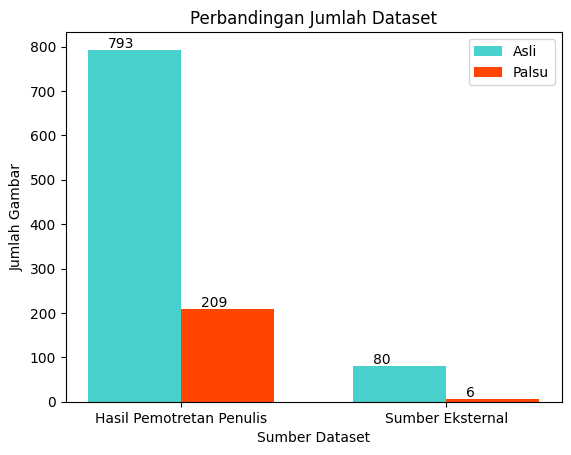

time: 319 ms (started: 2024-08-11 12:39:25 +00:00)


In [21]:
show_count_datasets(dir_path)

/tmp/ipykernel_34/1519368549.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


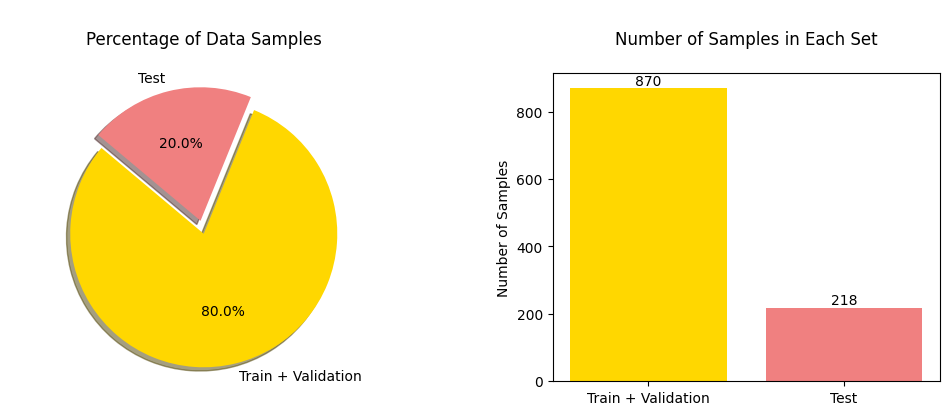

time: 347 ms (started: 2024-08-11 12:39:26 +00:00)


In [22]:
show_number_of_data_separation_train_test(train_set, valid_set, test_set)

In [23]:
# show_number_of_data_separation(train_set, valid_set, test_set)

time: 275 µs (started: 2024-08-11 12:39:26 +00:00)


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


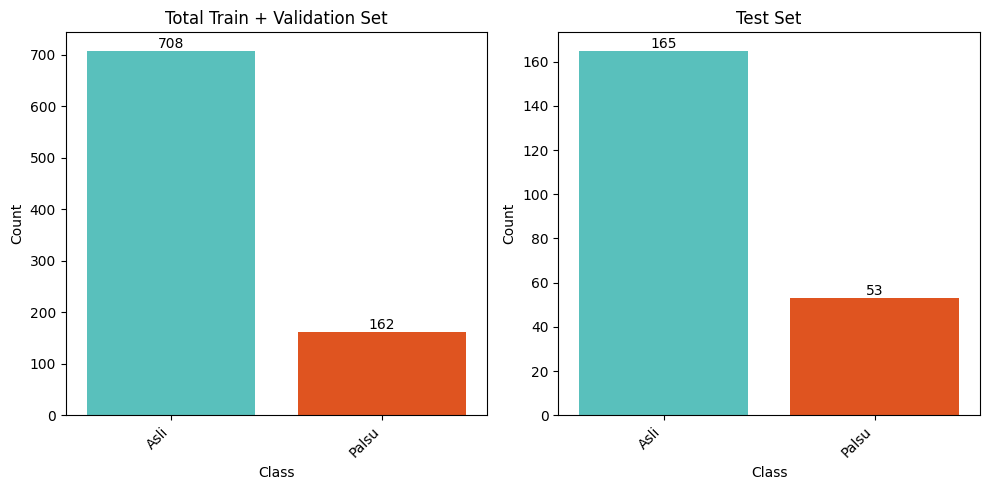

time: 399 ms (started: 2024-08-11 12:39:26 +00:00)


In [24]:
show_number_of_sample_train_test(train_set, valid_set, test_set)

In [25]:
# show_number_of_sample(train_set, valid_set, test_set)

time: 290 µs (started: 2024-08-11 12:39:26 +00:00)


In [26]:
test_set.class_indices

{'Asli': 0, 'Palsu': 1}

time: 7.5 ms (started: 2024-08-11 12:39:26 +00:00)


Train Set:


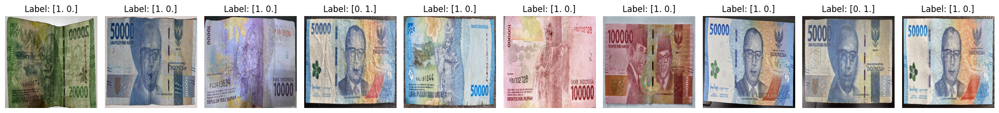

Validation Set:


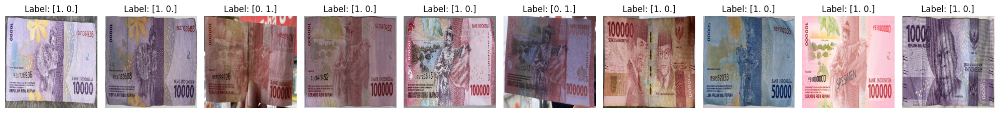

Test Set:


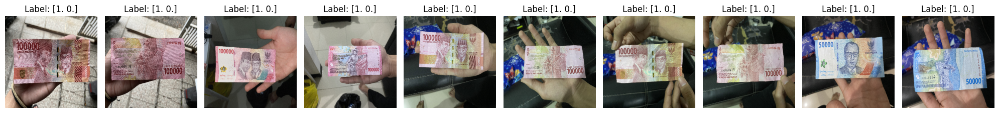

time: 13.5 s (started: 2024-08-11 12:39:26 +00:00)


In [27]:
print("Train Set:")
show_images_from_generator(train_set, num_images=10)

print("Validation Set:")
show_images_from_generator(valid_set, num_images=10)

print("Test Set:")
show_images_from_generator(test_set, num_images=10)

# 6. Hyperparameter Tuning for Best Model (Using Optuna)

In [28]:
def create_model(trial):
    # Suggest hyperparameters
    optimizer_name = trial.suggest_categorical('optimizer', ['adam', 'adamw', 'rmsprop', 'sgd'])
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-1)
#     dense_units = trial.suggest_categorical('dense_units', [64, 128, 512])
    dropout_rate = trial.suggest_categorical('dropout_rate', [0.2, 0.5])

    base_model = tf.keras.applications.EfficientNetV2B2(
        include_top=False,
        weights='imagenet',
        input_shape=(Config.IMAGE_SIZE, Config.IMAGE_SIZE, Config.CHANNEL),
        pooling='avg',
    )
    base_model.trainable = True

    x = Dense(units=512, activation='relu')(base_model.output)
    x = Dropout(rate=dropout_rate)(x)
    x = Dense(units=Config.OUTPUT_LAYER, activation=Config.OUTPUT_ACTIVATION)(x)

    model = tf.keras.models.Model(inputs=base_model.input, outputs=x, name='efficientnetv2b2_model')

    if optimizer_name == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_name == 'adamw':
        optimizer = AdamW(learning_rate=learning_rate)
    elif optimizer_name == 'rmsprop':
        optimizer = RMSprop(learning_rate=learning_rate)
    elif optimizer_name == 'sgd':
        optimizer = SGD(learning_rate=learning_rate)

    model.compile(
        loss=CategoricalCrossentropy(),
        optimizer=optimizer,
        metrics=['accuracy'],
    )

    return model

def objective(trial):
    # Create a new model for each trial
    model = create_model(trial)

    # Define your callbacks
    CALLBACKS = callbacks_list(
        monitor=Config.MONITOR,
        model_save_pathname=f'efficientnetv2b2_best_model_trial_{trial.number}.keras',  # Unique model name for each trial
        early_stopping_patience=Config.ES_PATIENCE,
        learning_rate_patience=Config.LR_PATIENCE,
        learning_rate_scheme=Config.LR_SCHEME
    )

    # Train the model using your custom training function
    history = train_model_with_callbacks(
        model=model,
        training_set=train_set,
        validation_set=valid_set,
        epochs=Config.EPOCH,
        batch_size=Config.BATCH_SIZE,
        verbose='auto',
        callbacks=CALLBACKS,
    )

    # Load the best model saved during training
    best_model_path = f'efficientnetv2b2_best_model_trial_{trial.number}.keras'
    model = load_model(best_model_path)
    
    # Evaluate the model on the validation set
    val_loss, val_accuracy = model.evaluate(valid_set, steps=len(valid_set), verbose=0)
    
    return val_loss

# Create an Optuna study with TPESampler
sampler = optuna.samplers.TPESampler()
study = optuna.create_study(direction='minimize', sampler=sampler)  # 'minimize' for minimizing the loss

# Run optimization with unlimited timeout
study.optimize(objective, n_trials=100, timeout=18000)  # No timeout specified

# Print the best parameters
print("Best trial:")
trial = study.best_trial

print(f"  Value: {trial.value}")
print("  Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

[I 2024-08-11 12:39:40,452] A new study created in memory with name: no-name-e5dd28e3-f7c2-4ec4-8203-52f358dbe9b3
/tmp/ipykernel_34/209590138.py:4: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-1)


35839040/35839040 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
		START TRAINING

Epoch 1/1000


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1723380179.910033     142 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.5514 - loss: 0.6622
Epoch 1: val_loss improved from inf to 1.46800, saving model to efficientnetv2b2_best_model_trial_0.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 340s 8s/step - accuracy: 0.5589 - loss: 0.6573 - val_accuracy: 0.1846 - val_loss: 1.4680 - learning_rate: 5.2428e-05
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8974 - loss: 0.3043
Epoch 2: val_loss improved from 1.46800 to 1.46279, saving model to efficientnetv2b2_best_model_trial_0.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.8974 - loss: 0.3032 - val_accuracy: 0.1962 - val_loss: 1.4628 - learning_rate: 5.2428e-05
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9311 - loss: 0.1931
Epoch 3: val_loss improved from 1.46279 to 0.56754, saving model to efficientnetv2b2_best_model_trial_0.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9314 - loss: 0.1922 - val_accuracy: 0.7077 - val_loss: 0.5675 - learning_rate: 5.2428e-05
Ep

[I 2024-08-11 12:58:12,307] Trial 0 finished with value: 0.16331474483013153 and parameters: {'optimizer': 'adam', 'learning_rate': 5.242830812817908e-05, 'dropout_rate': 0.5}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6402 - loss: 0.9759
Epoch 1: val_loss improved from inf to 1.45727, saving model to efficientnetv2b2_best_model_trial_1.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 285s 6s/step - accuracy: 0.6453 - loss: 0.9646 - val_accuracy: 0.1846 - val_loss: 1.4573 - learning_rate: 0.0046
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 991ms/step - accuracy: 0.8589 - loss: 0.3216
Epoch 2: val_loss improved from 1.45727 to 0.42875, saving model to efficientnetv2b2_best_model_trial_1.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.8596 - loss: 0.3206 - val_accuracy: 0.8000 - val_loss: 0.4287 - learning_rate: 0.0046
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 998ms/step - accuracy: 0.9104 - loss: 0.2316
Epoch 3: val_loss did not improve from 0.42875
20/20 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.9101 - loss: 0.2333 - val_accuracy: 0.3615 - val_loss: 3.8532 - learning_rate: 0.0046
Epoch 4/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 

[I 2024-08-11 13:10:46,406] Trial 1 finished with value: 0.4287452697753906 and parameters: {'optimizer': 'adamw', 'learning_rate': 0.004633158253545822, 'dropout_rate': 0.5}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7701 - loss: 0.4238
Epoch 1: val_loss improved from inf to 2.06746, saving model to efficientnetv2b2_best_model_trial_2.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 259s 6s/step - accuracy: 0.7749 - loss: 0.4173 - val_accuracy: 0.1846 - val_loss: 2.0675 - learning_rate: 3.5771e-04
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 980ms/step - accuracy: 0.9572 - loss: 0.1153
Epoch 2: val_loss did not improve from 2.06746
20/20 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.9576 - loss: 0.1139 - val_accuracy: 0.1846 - val_loss: 3.2900 - learning_rate: 3.5771e-04
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1000ms/step - accuracy: 0.9740 - loss: 0.0769
Epoch 3: val_loss improved from 2.06746 to 1.89183, saving model to efficientnetv2b2_best_model_trial_2.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9739 - loss: 0.0766 - val_accuracy: 0.4423 - val_loss: 1.8918 - learning_rate: 3.5771e-04
Epoch 4/1000
20/20 ━━━━━━━━

[I 2024-08-11 13:34:09,803] Trial 2 finished with value: 0.21088258922100067 and parameters: {'optimizer': 'adam', 'learning_rate': 0.0003577116837014487, 'dropout_rate': 0.5}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.3879 - loss: 0.7293
Epoch 1: val_loss improved from inf to 0.75547, saving model to efficientnetv2b2_best_model_trial_3.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 195s 5s/step - accuracy: 0.3920 - loss: 0.7280 - val_accuracy: 0.1846 - val_loss: 0.7555 - learning_rate: 0.0025
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 935ms/step - accuracy: 0.7093 - loss: 0.6331
Epoch 2: val_loss improved from 0.75547 to 0.72309, saving model to efficientnetv2b2_best_model_trial_3.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.7111 - loss: 0.6322 - val_accuracy: 0.3462 - val_loss: 0.7231 - learning_rate: 0.0025
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8508 - loss: 0.5617
Epoch 3: val_loss improved from 0.72309 to 0.65871, saving model to efficientnetv2b2_best_model_trial_3.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.8497 - loss: 0.5611 - val_accuracy: 0.5885 - val_loss: 0.6587 - le

[I 2024-08-11 14:25:14,611] Trial 3 finished with value: 0.22065305709838867 and parameters: {'optimizer': 'sgd', 'learning_rate': 0.002470940913536, 'dropout_rate': 0.2}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8402 - loss: 0.3892
Epoch 1: val_loss improved from inf to 1.87053, saving model to efficientnetv2b2_best_model_trial_4.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 290s 7s/step - accuracy: 0.8429 - loss: 0.3835 - val_accuracy: 0.1846 - val_loss: 1.8705 - learning_rate: 3.7008e-04
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9450 - loss: 0.1373
Epoch 2: val_loss improved from 1.87053 to 0.76361, saving model to efficientnetv2b2_best_model_trial_4.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9446 - loss: 0.1383 - val_accuracy: 0.5038 - val_loss: 0.7636 - learning_rate: 3.7008e-04
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9618 - loss: 0.0808
Epoch 3: val_loss did not improve from 0.76361
20/20 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9621 - loss: 0.0803 - val_accuracy: 0.6577 - val_loss: 1.1413 - learning_rate: 3.7008e-04
Epoch 4/1000
20/20 ━━━━━━━━━━━━━━━

[I 2024-08-11 14:49:51,187] Trial 4 finished with value: 0.2223963737487793 and parameters: {'optimizer': 'adam', 'learning_rate': 0.0003700779792638855, 'dropout_rate': 0.2}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7541 - loss: 0.5860
Epoch 1: val_loss improved from inf to 1.42569, saving model to efficientnetv2b2_best_model_trial_5.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 265s 6s/step - accuracy: 0.7570 - loss: 0.5818 - val_accuracy: 0.1846 - val_loss: 1.4257 - learning_rate: 4.9035e-05
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 992ms/step - accuracy: 0.9302 - loss: 0.2619
Epoch 2: val_loss improved from 1.42569 to 1.36616, saving model to efficientnetv2b2_best_model_trial_5.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9295 - loss: 0.2613 - val_accuracy: 0.1923 - val_loss: 1.3662 - learning_rate: 4.9035e-05
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9433 - loss: 0.1904
Epoch 3: val_loss improved from 1.36616 to 0.36672, saving model to efficientnetv2b2_best_model_trial_5.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9433 - loss: 0.1898 - val_accuracy: 0.8192 - val_loss: 0.3

[I 2024-08-11 15:07:36,193] Trial 5 finished with value: 0.17471148073673248 and parameters: {'optimizer': 'adam', 'learning_rate': 4.9034776240130115e-05, 'dropout_rate': 0.2}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.6179 - loss: 0.6375
Epoch 1: val_loss improved from inf to 0.79554, saving model to efficientnetv2b2_best_model_trial_6.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 211s 6s/step - accuracy: 0.6220 - loss: 0.6360 - val_accuracy: 0.1846 - val_loss: 0.7955 - learning_rate: 0.0042
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 996ms/step - accuracy: 0.8213 - loss: 0.5258
Epoch 2: val_loss did not improve from 0.79554
20/20 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.8216 - loss: 0.5252 - val_accuracy: 0.1885 - val_loss: 0.8181 - learning_rate: 0.0042
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8253 - loss: 0.4777
Epoch 3: val_loss improved from 0.79554 to 0.67560, saving model to efficientnetv2b2_best_model_trial_6.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.8264 - loss: 0.4768 - val_accuracy: 0.4885 - val_loss: 0.6756 - learning_rate: 0.0042
Epoch 4/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 

[I 2024-08-11 15:55:38,207] Trial 6 finished with value: 0.2086367905139923 and parameters: {'optimizer': 'sgd', 'learning_rate': 0.004171543115274489, 'dropout_rate': 0.5}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7814 - loss: 0.4248
Epoch 1: val_loss improved from inf to 1.75901, saving model to efficientnetv2b2_best_model_trial_7.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 249s 6s/step - accuracy: 0.7862 - loss: 0.4185 - val_accuracy: 0.1846 - val_loss: 1.7590 - learning_rate: 1.5933e-04
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9709 - loss: 0.0884
Epoch 2: val_loss did not improve from 1.75901
20/20 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.9711 - loss: 0.0880 - val_accuracy: 0.1846 - val_loss: 2.3121 - learning_rate: 1.5933e-04
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9800 - loss: 0.0816
Epoch 3: val_loss improved from 1.75901 to 0.48702, saving model to efficientnetv2b2_best_model_trial_7.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9801 - loss: 0.0810 - val_accuracy: 0.8538 - val_loss: 0.4870 - learning_rate: 1.5933e-04
Epoch 4/1000
20/20 ━━━━━━━━━━━━━━━

[I 2024-08-11 16:23:40,281] Trial 7 finished with value: 0.21703572571277618 and parameters: {'optimizer': 'rmsprop', 'learning_rate': 0.0001593340241676185, 'dropout_rate': 0.2}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7336 - loss: 0.5909
Epoch 1: val_loss improved from inf to 0.77201, saving model to efficientnetv2b2_best_model_trial_8.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 212s 6s/step - accuracy: 0.7367 - loss: 0.5877 - val_accuracy: 0.1846 - val_loss: 0.7720 - learning_rate: 0.0157
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8355 - loss: 0.3847
Epoch 2: val_loss did not improve from 0.77201
20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.8355 - loss: 0.3843 - val_accuracy: 0.2038 - val_loss: 0.7877 - learning_rate: 0.0157
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8894 - loss: 0.3556
Epoch 3: val_loss did not improve from 0.77201
20/20 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.8892 - loss: 0.3548 - val_accuracy: 0.2346 - val_loss: 0.8521 - learning_rate: 0.0157
Epoch 4/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8831 - loss: 0.3171
Epoch 4: val_loss did no

[I 2024-08-11 16:52:18,039] Trial 8 finished with value: 0.22708751261234283 and parameters: {'optimizer': 'sgd', 'learning_rate': 0.015724075315640247, 'dropout_rate': 0.5}. Best is trial 0 with value: 0.16331474483013153.


		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4532 - loss: 0.7183
Epoch 1: val_loss improved from inf to 0.64819, saving model to efficientnetv2b2_best_model_trial_9.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 211s 5s/step - accuracy: 0.4546 - loss: 0.7179 - val_accuracy: 0.8154 - val_loss: 0.6482 - learning_rate: 8.5580e-04
Epoch 2/1000
19/20 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.6004 - loss: 0.6795
Epoch 2: val_loss did not improve from 0.64819
20/20 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.6005 - loss: 0.6785 - val_accuracy: 0.3231 - val_loss: 0.7185 - learning_rate: 8.5580e-04
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7012 - loss: 0.6443
Epoch 3: val_loss improved from 0.64819 to 0.63412, saving model to efficientnetv2b2_best_model_trial_9.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.7019 - loss: 0.6441 - val_accuracy: 0.6923 - val_loss: 0.6341 - learning_rate: 8.5580e-04
Epoch 4/1000
20/20 ━━━━━━━━━━━━━━━

[I 2024-08-11 17:49:12,161] Trial 9 finished with value: 0.3231000006198883 and parameters: {'optimizer': 'sgd', 'learning_rate': 0.0008558016250483761, 'dropout_rate': 0.2}. Best is trial 0 with value: 0.16331474483013153.


Best trial:
  Value: 0.16331474483013153
  Params: 
    optimizer: adam
    learning_rate: 5.242830812817908e-05
    dropout_rate: 0.5
time: 5h 9min 31s (started: 2024-08-11 12:39:40 +00:00)


## Best Params

In [35]:
study.best_params

{'optimizer': 'adam',
 'learning_rate': 5.242830812817908e-05,
 'dropout_rate': 0.5}

time: 4.24 ms (started: 2024-08-11 18:09:57 +00:00)


In [37]:
study.best_trials

[FrozenTrial(number=0, state=TrialState.COMPLETE, values=[0.16331474483013153], datetime_start=datetime.datetime(2024, 8, 11, 12, 39, 40, 454154), datetime_complete=datetime.datetime(2024, 8, 11, 12, 58, 12, 306800), params={'optimizer': 'adam', 'learning_rate': 5.242830812817908e-05, 'dropout_rate': 0.5}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'optimizer': CategoricalDistribution(choices=('adam', 'adamw', 'rmsprop', 'sgd')), 'learning_rate': FloatDistribution(high=0.1, log=True, low=1e-05, step=None), 'dropout_rate': CategoricalDistribution(choices=(0.2, 0.5))}, trial_id=0, value=None)]

time: 4.69 ms (started: 2024-08-11 18:14:45 +00:00)


In [38]:
study.best_value

0.16331474483013153

time: 2.82 ms (started: 2024-08-11 18:14:57 +00:00)


In [40]:
study.directions

[<StudyDirection.MINIMIZE: 1>]

time: 2.7 ms (started: 2024-08-11 18:15:15 +00:00)


## Plot Optimization History

In [29]:
# Plot the optimization history
optimization_history = vis.plot_optimization_history(study)
optimization_history.show()

time: 415 ms (started: 2024-08-11 17:49:12 +00:00)


## Plot Param Importances

In [30]:
# Plot the parameter importance
param_importance = vis.plot_param_importances(study)
param_importance.show()

time: 276 ms (started: 2024-08-11 17:49:12 +00:00)


## Plot Prallel Coordinate

In [32]:
# Plot the parallel coordinate plot
parallel_plot = vis.plot_parallel_coordinate(study)
parallel_plot.show()

time: 68.2 ms (started: 2024-08-11 17:49:13 +00:00)


## Plot Slice

In [31]:
# Plot slice plot
slice_plot = vis.plot_slice(study)
slice_plot.show()

time: 281 ms (started: 2024-08-11 17:49:12 +00:00)


# 7. Training with Best Parameters

## 7.1. EfficientNetV2B2

In [49]:
best_params = study.best_params
best_params

{'optimizer': 'adam',
 'learning_rate': 5.242830812817908e-05,
 'dropout_rate': 0.5}

time: 5.49 ms (started: 2024-08-11 18:30:38 +00:00)


In [50]:
best_optimizer = best_params['optimizer']
best_learning_rate = best_params['learning_rate']
best_dropout_rate = best_params['dropout_rate']

time: 533 µs (started: 2024-08-11 18:30:41 +00:00)


In [57]:
base_model = tf.keras.applications.EfficientNetV2B2(
    include_top=False,
    weights='imagenet',
    input_shape=(Config.IMAGE_SIZE, Config.IMAGE_SIZE, Config.CHANNEL),
    pooling='avg',
)

base_model.trainable = True

x = Dense(units=512, activation='relu')(base_model.output)
x = Dropout(rate=best_dropout_rate)(x)
x = Dense(units=Config.OUTPUT_LAYER, activation=Config.OUTPUT_ACTIVATION)(x)

efficientnetv2b2_model_optuna = tf.keras.models.Model(inputs=base_model.input, outputs=x, name='efficientnetv2b2_model')

if best_optimizer == 'adam':
    optimizer = Adam(learning_rate=best_learning_rate)
elif best_optimizer == 'adamw':
    optimizer = AdamW(learning_rate=best_learning_rate)
elif best_optimizer == 'rmsprop':
    optimizer = RMSprop(learning_rate=best_learning_rate)
elif best_optimizer == 'sgd':
    optimizer = SGD(learning_rate=best_learning_rate)

efficientnetv2b2_model_optuna.compile(
    loss=CategoricalCrossentropy(),
    optimizer=optimizer,
    metrics=['accuracy'],
)

model.summary()

Model: "efficientnetv2b2_model"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 448, 448,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_11        │ (None, 448, 448,  │          0 │ input_layer_11[0… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_11    │ (None, 448, 448,  │          0 │ rescaling_11[0][… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 224, 224,  │        864 │ normalization_11… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 224, 224,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 224, 224,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 224, 224,  │      4,608 │ stem_activation[… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 224, 224,  │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 224, 224,  │          0 │ block1a_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 224, 224,  │      2,304 │ block1a_project_… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 224, 224,  │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 224, 224,  │          0 │ block1b_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 224, 224,  │          0 │ block1b_project_… │
│ (Dropout)           │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 224, 224,  │          0 │ block1b_drop[0][… │
│                     │ 16)               │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 112, 112,  │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 112, 112,  │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 112, 112,  │          0 │ block2a_expand_b

 Total params: 9,491,808 (36.21 MB)

 Trainable params: 9,409,520 (35.89 MB)

 Non-trainable params: 82,288 (321.44 KB)

time: 2.16 s (started: 2024-08-11 18:39:17 +00:00)


In [58]:
CALLBACKS = callbacks_list(
    monitor=Config.MONITOR,
    model_save_pathname='efficientnetv2b2_best_model_optuna.keras',
    early_stopping_patience=Config.ES_PATIENCE,
    learning_rate_patience=Config.LR_PATIENCE,
    learning_rate_scheme=Config.LR_SCHEME
)

efficientnetv2b2_optuna_history = train_model_with_callbacks(
    model=efficientnetv2b2_model_optuna,
    training_set=train_set,
    validation_set=valid_set,
    epochs=Config.EPOCH,
    batch_size=Config.BATCH_SIZE,
    verbose='auto',
    callbacks=CALLBACKS,
)

		START TRAINING

Epoch 1/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.5381 - loss: 0.6917
Epoch 1: val_loss improved from inf to 1.38956, saving model to efficientnetv2b2_best_model_optuna.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 297s 8s/step - accuracy: 0.5445 - loss: 0.6872 - val_accuracy: 0.1846 - val_loss: 1.3896 - learning_rate: 5.2428e-05
Epoch 2/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8724 - loss: 0.3820
Epoch 2: val_loss did not improve from 1.38956
20/20 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.8738 - loss: 0.3794 - val_accuracy: 0.1962 - val_loss: 1.4624 - learning_rate: 5.2428e-05
Epoch 3/1000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9273 - loss: 0.2058
Epoch 3: val_loss improved from 1.38956 to 0.48750, saving model to efficientnetv2b2_best_model_optuna.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9273 - loss: 0.2048 - val_accuracy: 0.7577 - val_loss: 0.4875 - learning_rate: 5.2428e-05
Epoch 4/1000
20/20 ━━━━━━━━━━━━━━━━━

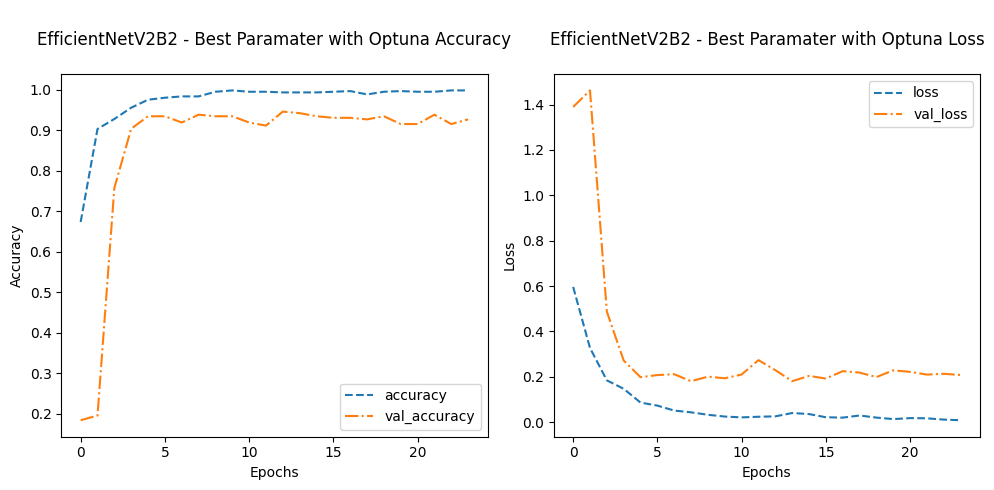

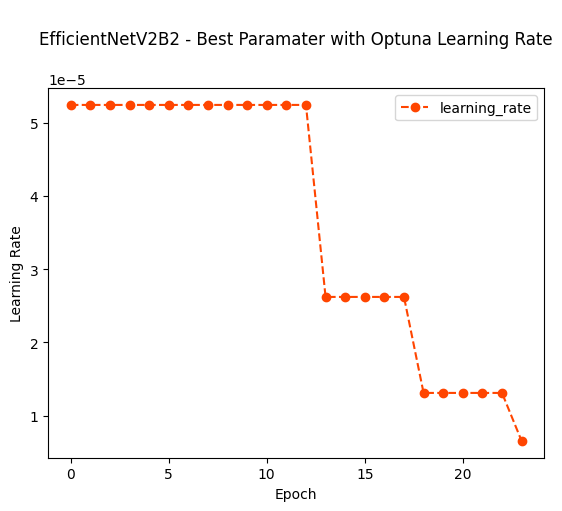

time: 914 ms (started: 2024-08-11 19:00:44 +00:00)


In [59]:
try:
    History(efficientnetv2b2_optuna_history, model_name='EfficientNetV2B2 - Best Paramater with Optuna').plot_accuracy_and_lost()
    History(efficientnetv2b2_optuna_history, model_name='EfficientNetV2B2 - Best Paramater with Optuna').plot_learningrate()
except AttributeError:
    print("\nKesalahan: History training tidak ada!\n")

In [60]:
try:
    history_df = history_to_dataframe(efficientnetv2b2_optuna_history, 'efficientnetv2b2_best_parameter_with_optuna')
    history_df
except AttributeError:
    print("\nKesalahan: History training tidak ada!\n")

Validation Loss Terendah: 0.1810 pada Epoch: 14
Training Loss Terendah: 0.0089 pada Epoch: 24
Validation Accuracy Tertinggi: 0.9462 pada Epoch: 13
Training Accuracy Tertinggi: 0.9984 pada Epoch: 10
time: 73.8 ms (started: 2024-08-11 19:00:45 +00:00)


# 8. Evaluate

## 8.1. EfficientNetV2B2

7/7 ━━━━━━━━━━━━━━━━━━━━ 38s 4s/step
EfficientNetV2B2 - Best Paramater with Optuna Classification Report
              precision    recall  f1-score   support

        Asli       0.85      0.98      0.91       165
       Palsu       0.86      0.47      0.61        53

    accuracy                           0.85       218
   macro avg       0.86      0.72      0.76       218
weighted avg       0.85      0.85      0.84       218



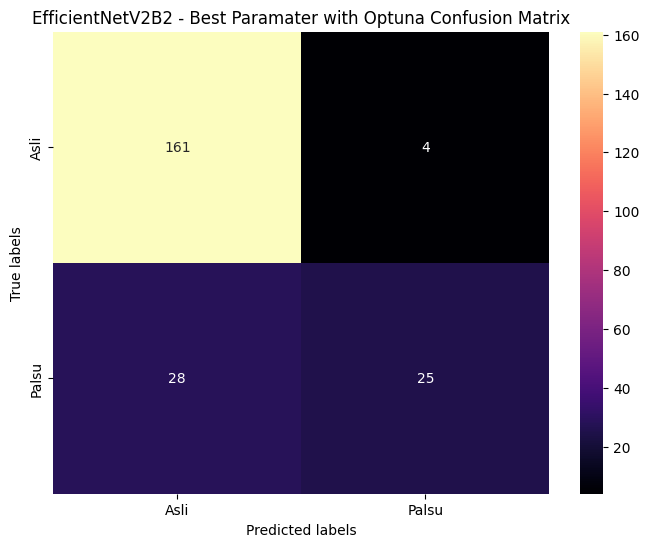

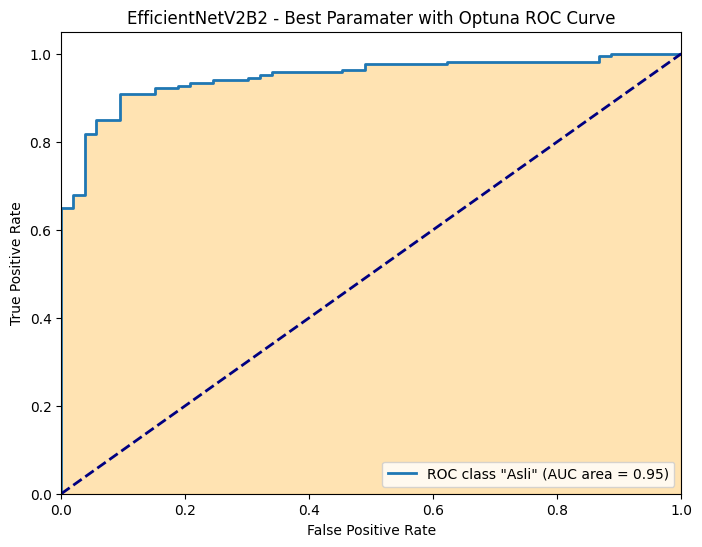

time: 49.6 s (started: 2024-08-11 19:00:45 +00:00)


In [61]:
try:
    efficientnetv2b2_best_model_optuna = load_model('efficientnetv2b2_best_model_optuna.keras')
    efficientnetv2b2_evaluator = ModelEvaluation(efficientnetv2b2_best_model_optuna, test_set, model_name='EfficientNetV2B2 - Best Paramater with Optuna')

    efficientnetv2b2_y_true, efficientnetv2b2_y_pred = efficientnetv2b2_evaluator.predict_test()
    
    efficientnetv2b2_evaluator.classification_report()
    efficientnetv2b2_evaluator.plot_confusion_matrix()
    efficientnetv2b2_evaluator.plot_roc_auc()
except OSError as e:
    print(f'Kesalahan: {e} (Tidak ada model yang tersimpan) !!!')
except ValueError as e:
    print(f'Kesalahan: {e} (Tidak ada model yang tersimpan) !!!')

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/7 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step 

I0000 00:00:1723404254.261046    6057 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


7/7 ━━━━━━━━━━━━━━━━━━━━ 61s 6s/step
EfficientNetV2B2 - Best Paramater with Optuna Classification Report
              precision    recall  f1-score   support

        Asli       0.89      0.97      0.93       165
       Palsu       0.87      0.64      0.74        53

    accuracy                           0.89       218
   macro avg       0.88      0.81      0.83       218
weighted avg       0.89      0.89      0.88       218



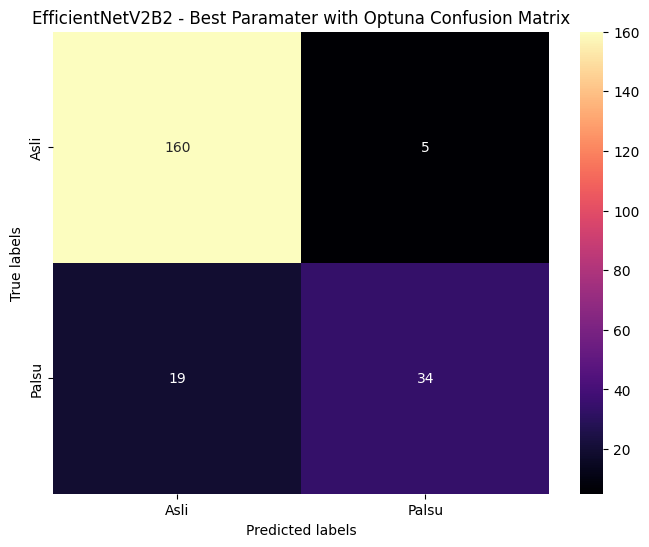

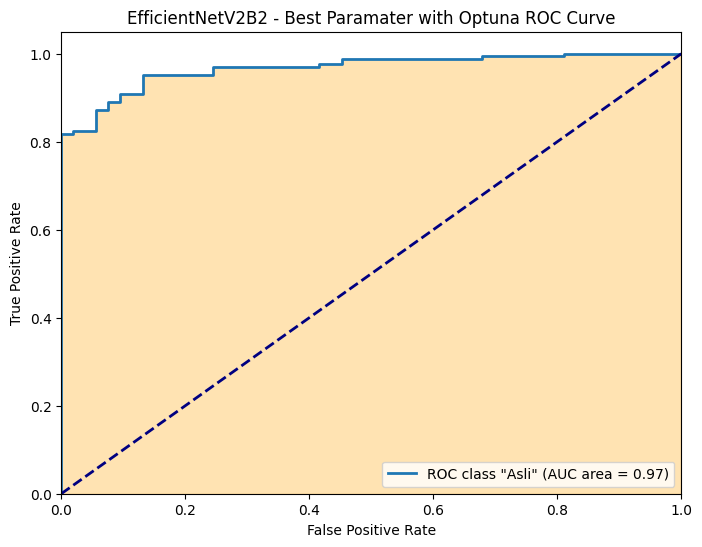

time: 1min 13s (started: 2024-08-11 19:23:39 +00:00)


In [13]:
try:
    efficientnetv2b2_best_model_optuna = load_model('efficientnetv2b2_best_model_trial_0.keras')
    efficientnetv2b2_evaluator = ModelEvaluation(efficientnetv2b2_best_model_optuna, test_set, model_name='EfficientNetV2B2 - Best Paramater with Optuna')

    efficientnetv2b2_y_true, efficientnetv2b2_y_pred = efficientnetv2b2_evaluator.predict_test()
    
    efficientnetv2b2_evaluator.classification_report()
    efficientnetv2b2_evaluator.plot_confusion_matrix()
    efficientnetv2b2_evaluator.plot_roc_auc()
except OSError as e:
    print(f'Kesalahan: {e} (Tidak ada model yang tersimpan) !!!')
except ValueError as e:
    print(f'Kesalahan: {e} (Tidak ada model yang tersimpan) !!!')

# 9. Visualizing with Grad-CAM

"Gradient-weighted Class Activation Mapping (Grad-CAM), uses the gradients of any target concept (say 'dog' in a classification network or a sequence of words in captioning network) flowing into the final convolutional layer to produce a coarse localization map highlighting the important regions in the image for predicting the concept." **- Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization** (Ramprasaath R. Selvaraju, Michael Cogswell, Abhishek Das, Ramakrishna Vedantam, Devi Parikh, Dhruv Batra)

- Derivative of the class with the highest probability returned by the softmax layer is taken with respect to the final convolutional layer to produce a heat map which highlights the important regions in the image that activated the class.
- For full mathematical details please check out this paper: https://arxiv.org/abs/1610.02391

In [78]:
GradCAM_config = {
    'model_list' : {
#         'custom_cnn' : cnn_model,
#         'vgg19' : vgg19_model,
        'efficientnetv2b2' : efficientnetv2b2_model_optuna,
    },
    'last_conv_layer' : {
        'custom_cnn' : -5, # conv2d_4 (Conv2D)
        'vgg19' : -5, # block5_conv4 (Conv2D)
        'efficientnetv2b2' : -7, # top_conv (Conv2D)
    },
    'y_true' : {
#         'custom_cnn' : cnn_y_true,
#         'vgg19' : vgg19_y_true,
        'efficientnetv2b2' : efficientnetv2b2_y_true,
    },
    'y_pred' : {
#         'custom_cnn' : cnn_y_pred,
#         'vgg19' : vgg19_y_pred,
        'efficientnetv2b2' : efficientnetv2b2_y_pred,
    },
    'prob_threshold' : 0.75,
}

time: 1.09 ms (started: 2024-08-11 19:11:35 +00:00)


In [79]:
model = GradCAM_config['model_list']['efficientnetv2b2']
last_conv_layer = GradCAM_config['last_conv_layer']['efficientnetv2b2']
y_true = GradCAM_config['y_true']['efficientnetv2b2']
y_pred = GradCAM_config['y_pred']['efficientnetv2b2']
model.layers[last_conv_layer].output

<KerasTensor shape=(None, 14, 14, 1408), dtype=float32, sparse=False, name=keras_tensor_12788>

time: 3.57 ms (started: 2024-08-11 19:11:36 +00:00)


In [80]:
y_val = y_true
y_pred = y_pred
y_pred_classes = np.argmax(y_pred, axis=1)
y_pred_probs = np.max(y_pred, axis=1)

class_indices = test_set.class_indices
indices = {v:k for k,v in class_indices.items()}

filenames = test_set.filenames

val_df = pd.DataFrame()
val_df['filename'] = filenames
val_df['actual'] = y_val
val_df['predicted'] = y_pred_classes
val_df['probability'] = y_pred_probs
val_df['actual'] = val_df['actual'].apply(lambda x: indices[x])
val_df['predicted'] = val_df['predicted'].apply(lambda x: indices[x])
val_df.loc[val_df['actual']==val_df['predicted'],'Same'] = True
val_df.loc[val_df['actual']!=val_df['predicted'],'Same'] = False
val_df.head(10)

,filename,actual,predicted,probability,Same
0,Asli/IMG_3422.jpg,Asli,Asli,0.994899,True
1,Asli/IMG_3423.jpg,Asli,Asli,0.999777,True
2,Asli/IMG_3516.jpg,Asli,Asli,0.999372,True
3,Asli/IMG_3517.jpg,Asli,Asli,0.996649,True
4,Asli/IMG_3518.jpg,Asli,Asli,0.999974,True
5,Asli/IMG_3519.jpg,Asli,Asli,0.994514,True
6,Asli/IMG_3520.jpg,Asli,Asli,0.999566,True
7,Asli/IMG_3521.jpg,Asli,Asli,0.998868,True
8,Asli/IMG_3522.jpg,Asli,Asli,0.999852,True
9,Asli/IMG_3523.jpg,Asli,Asli,0.999137,True


time: 17.3 ms (started: 2024-08-11 19:11:42 +00:00)


In [81]:
val_df.describe().T

,count,mean,std,min,25%,50%,75%,max
probability,218.0,0.926574,0.121221,0.520764,0.91209,0.993558,0.999363,0.999995


time: 13.8 ms (started: 2024-08-11 19:11:43 +00:00)


In [82]:
number_of_correct_classfied = len(val_df[val_df['Same'] == True])
number_of_correct_classfied_asli = len(val_df[(val_df['Same'] == True) & (val_df['actual'] == 'Asli')])
number_of_correct_classfied_palsu = len(val_df[(val_df['Same'] == True) & (val_df['actual'] == 'Palsu')])
number_of_misclassfied = len(val_df[val_df['Same'] == False])
number_of_misclassfied_asli = len(val_df[(val_df['Same'] == False) & (val_df['actual'] == 'Asli')])
number_of_misclassfied_palsu = len(val_df[(val_df['Same'] == False) & (val_df['actual'] == 'Palsu')])
val_df = val_df.sample(frac=1).reset_index(drop=True)

time: 7.72 ms (started: 2024-08-11 19:11:43 +00:00)


### Image Visualization
- Correctly Classified (A and P are same)
- Misclassified (A and P are different)
- A: Actual P: Predicted

In [83]:
def readImage(path):
    img = load_img(path,color_mode=Config.COLOR_MODE,target_size=(Config.IMAGE_SIZE,Config.IMAGE_SIZE))
    img = img_to_array(img)
    img = img/255.

    return img

def display_images(temp_df, image_range=1):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize=(20, 20))
    n = 0
    for i in range(image_range):
        n += 1
        plt.subplot(5, 5, n)
        plt.subplots_adjust(hspace=0.5, wspace=0.3)
        image = readImage(f"{test_set_dir}/{temp_df.filename[i]}")
        if temp_df['Same'][i]:
            if temp_df.probability[i] < GradCAM_config['prob_threshold']:
                title_color = 'orange'
            else:
                title_color = 'green'
        else:
            if temp_df.probability[i] < GradCAM_config['prob_threshold']:
                title_color = 'orange'
            else:
                title_color = 'red'
        plt.imshow(image)
        plt.title(f'\n{temp_df.filename[i]}\nA: {temp_df.actual[i]} <> P: {temp_df.predicted[i]}\n[Prob: {temp_df.probability[i]:.2f}]', color=title_color)


time: 2.08 ms (started: 2024-08-11 19:11:44 +00:00)


### Number of Predictions and Visualized

In [84]:
print(f'TOTAL prediksi BENAR : {number_of_correct_classfied}')
print(f'Jumlah prediksi benar ASLI  : {number_of_correct_classfied_asli}')
print(f'Jumlah prediksi benar PALSU : {number_of_correct_classfied_palsu}')
print('-'*50)
print(f'TOTAL prediksi SALAH : {number_of_misclassfied}')
print(f'Jumlah prediksi salah ASLI  : {number_of_misclassfied_asli}')
print(f'Jumlah prediksi salah PALSU : {number_of_misclassfied_palsu}')

TOTAL prediksi BENAR : 186
Jumlah prediksi benar ASLI  : 161
Jumlah prediksi benar PALSU : 25
--------------------------------------------------
TOTAL prediksi SALAH : 32
Jumlah prediksi salah ASLI  : 4
Jumlah prediksi salah PALSU : 28
time: 1.07 ms (started: 2024-08-11 19:11:48 +00:00)


In [85]:
if number_of_correct_classfied_asli < 25:
    num_of_correct_visualizations_asli = number_of_correct_classfied_asli
else:
    num_of_correct_visualizations_asli = 25
    
if number_of_correct_classfied_palsu < 25:
    num_of_correct_visualizations_palsu = number_of_correct_classfied_palsu
else:
    num_of_correct_visualizations_palsu = 25
    
if number_of_misclassfied_asli < 25:
    num_of_incorrect_visualizations_asli = number_of_misclassfied_asli
else:
    num_of_incorrect_visualizations_asli = 25
    
if number_of_misclassfied_palsu < 25:
    num_of_incorrect_visualizations_palsu = number_of_misclassfied_palsu
else:
    num_of_incorrect_visualizations_palsu = 25
    
num_of_correct_visualizations_asli, num_of_correct_visualizations_palsu, num_of_incorrect_visualizations_asli, num_of_incorrect_visualizations_palsu

(25, 25, 4, 25)

time: 4.96 ms (started: 2024-08-11 19:11:48 +00:00)


### Correctly Classified

#### Asli

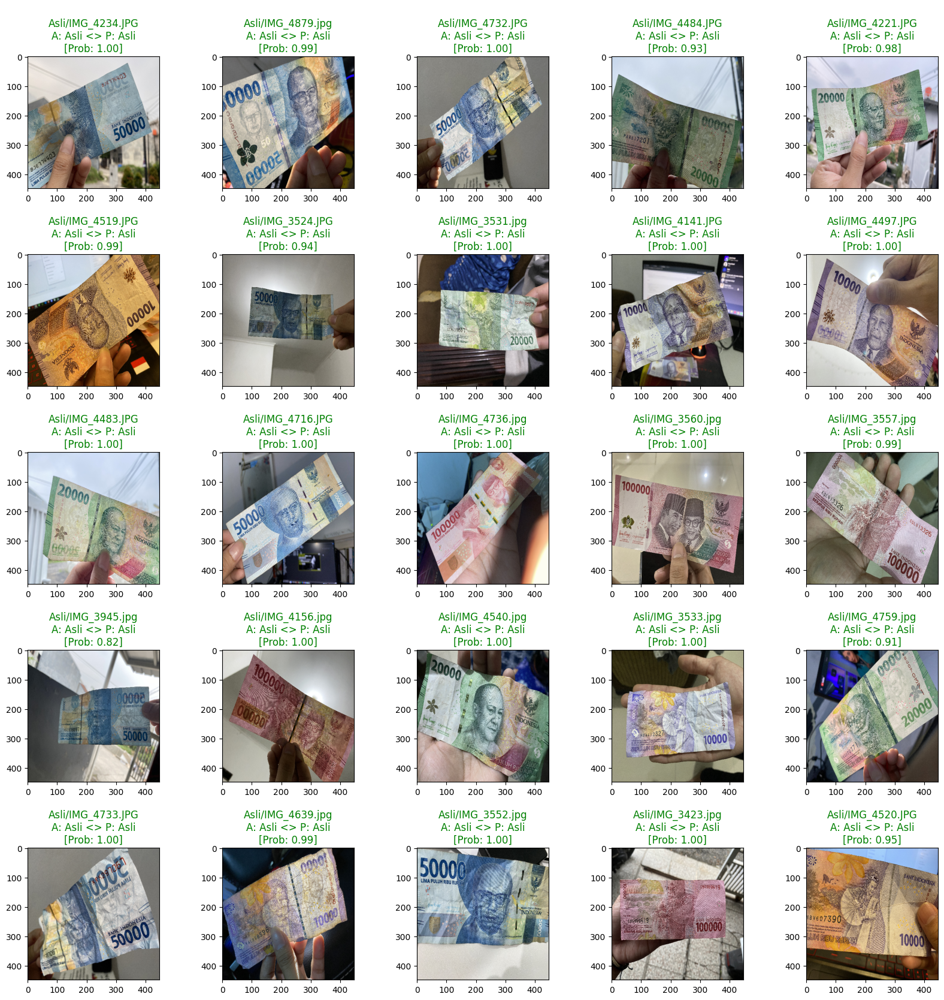

time: 9.08 s (started: 2024-08-11 19:11:48 +00:00)


In [86]:
display_images(val_df[(val_df['Same'] == True) & (val_df['actual'] == 'Asli')], image_range=num_of_correct_visualizations_asli)

#### Palsu

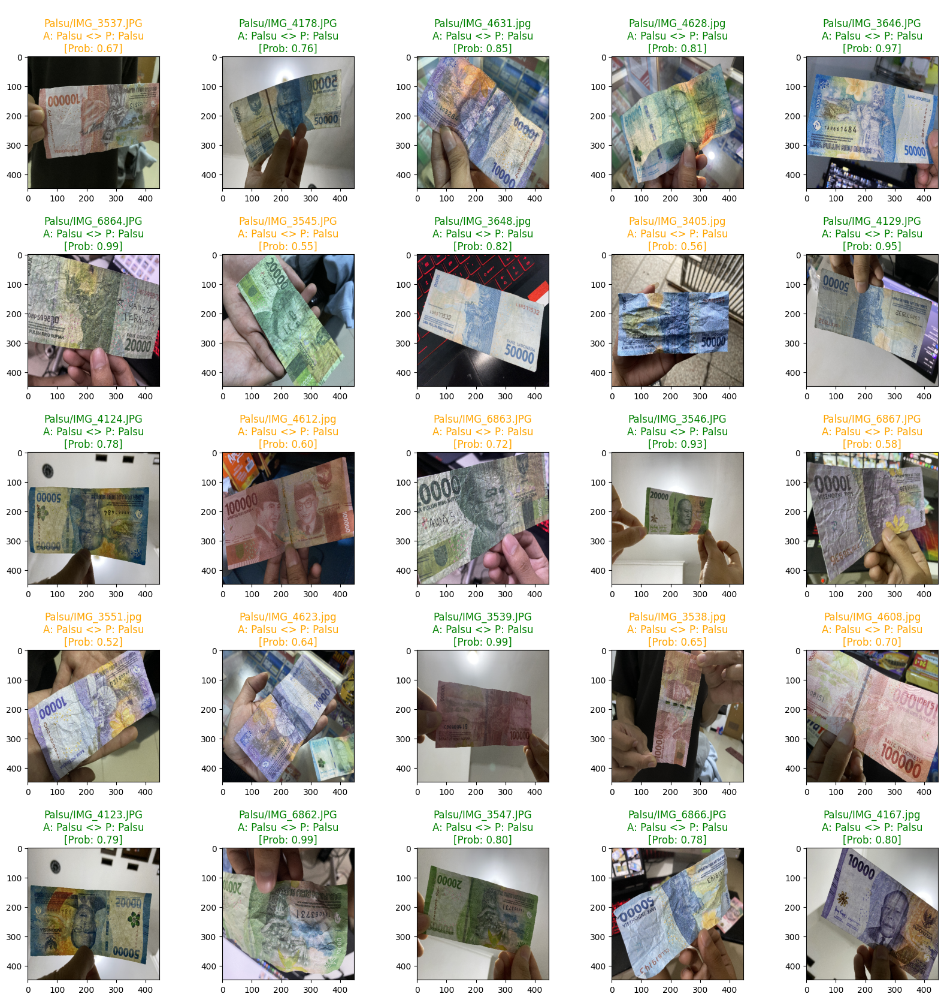

time: 8.64 s (started: 2024-08-11 19:11:57 +00:00)


In [87]:
display_images(val_df[(val_df['Same'] == True) & (val_df['actual'] == 'Palsu')], image_range=num_of_correct_visualizations_palsu)

### Misclassified

#### Asli

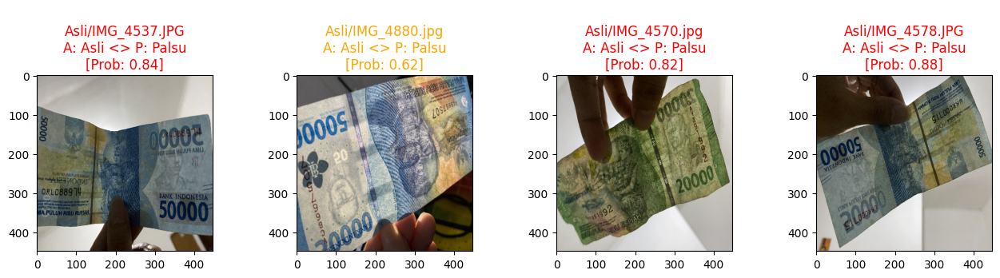

time: 1.45 s (started: 2024-08-11 19:12:06 +00:00)


In [88]:
display_images(val_df[(val_df['Same'] == False) & (val_df['actual'] == 'Asli')], image_range=num_of_incorrect_visualizations_asli)

#### Palsu

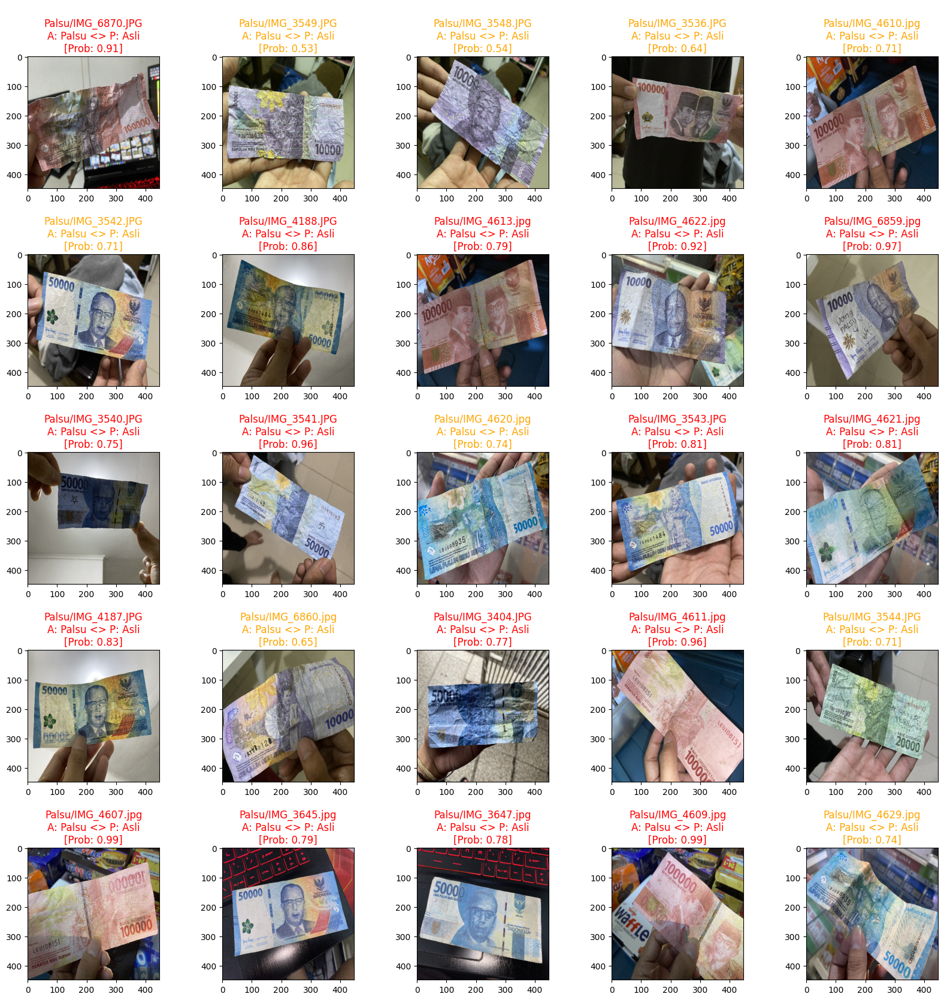

time: 8.95 s (started: 2024-08-11 19:12:07 +00:00)


In [89]:
display_images(val_df[(val_df['Same'] == False) & (val_df['actual'] == 'Palsu')], image_range=num_of_incorrect_visualizations_palsu)

### Grad-CAM Computation
- Gradient computed of the final softmax layer with respect to the last convolution layer
- Mean of the gradients is then multiplied to the last convolution layer's output
- The output is then passed through a relu function to ensure that all values are positive

In [90]:
def make_gradcam_heatmap(img_array, model, last_conv_layer=-3,  pred_index=None, ):

    grad_model = Model(inputs=model.inputs, outputs=[model.layers[last_conv_layer].output, model.output])

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy(), preds

time: 2.12 ms (started: 2024-08-11 19:12:16 +00:00)


### Grad-CAM Projection
- The heatmap produced using the Grad-CAM computation is then projected on to the original image
- The heatmap highlights the important parts of the image that lead to the activation of a class in the final softmax layer

In [91]:
def gradCAMImage(image):
    path = f"{test_set_dir}/{image}"
    img = readImage(path)
    img = np.expand_dims(img,axis=0)
    heatmap,preds = make_gradcam_heatmap(img, model, last_conv_layer)

    img = load_img(path)
    img = img_to_array(img)
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.8 + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    return superimposed_img

time: 8.48 ms (started: 2024-08-11 19:12:16 +00:00)


## Results

In [92]:
def gradcam_of_images(correct_class, class_name, image_range=1):
    grad_images = []
    title = []
#     temp_df = val_df[val_df['Same']==correct_class]
    temp_df = val_df[(val_df['Same'] == correct_class) & (val_df['actual'] == class_name)]
    temp_df = temp_df.reset_index(drop=True)
    for i in range(image_range):
        image = temp_df.filename[i]
        grad_image = gradCAMImage(image)
        grad_images.append(grad_image)
        if correct_class:
            if temp_df.probability[i] < GradCAM_config['prob_threshold']:
                title_color = 'orange'
            else:
                title_color = 'green'
        else:
            if temp_df.probability[i] < GradCAM_config['prob_threshold']:
                title_color = 'orange'
            else:
                title_color = 'red'
        title_text = f'\nA: {temp_df.actual[i]} <> P: {temp_df.predicted[i]}\n[Prob: {temp_df.probability[i]:.4f}]'
        title.append((title_text, title_color))

    return grad_images, title

time: 3.54 ms (started: 2024-08-11 19:12:16 +00:00)


### Correctly Classified

#### Asli

In [93]:
correctly_classified_asli, c_titles_asli = gradcam_of_images(correct_class=True, class_name='Asli', image_range=num_of_correct_visualizations_asli)

/tmp/ipykernel_34/274265248.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



time: 42.6 s (started: 2024-08-11 19:12:16 +00:00)


#### Palsu

In [1]:
correctly_classified_palsu, c_titles_palsu = gradcam_of_images(correct_class=True, class_name='Palsu', image_range=num_of_correct_visualizations_palsu)

NameError: name 'gradcam_of_images' is not defined

### Misclassified

#### Asli

In [ ]:
misclassified_asli, m_titles_asli = gradcam_of_images(correct_class=False, class_name='Asli', image_range=num_of_incorrect_visualizations_asli)

#### Palsu

In [ ]:
misclassified_palsu, m_titles_palsu = gradcam_of_images(correct_class=False, class_name='Palsu', image_range=num_of_incorrect_visualizations_palsu)

## Display-Heatmaps

In [ ]:
def display_heatmaps(classified_images, titles, image_range=1):
    plt.figure(figsize = (20, 20))
    n = 0
    for i in range(image_range):
        n+=1
        plt.subplot(5, 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        plt.imshow(classified_images[i])
        plt.title(titles[i][0], color=titles[i][1])
    plt.show()

### Grad-CAM: Correctly Classified

#### Asli

In [ ]:
display_heatmaps(classified_images=correctly_classified_asli, titles=c_titles_asli, image_range=num_of_correct_visualizations_asli)

#### Palsu

In [ ]:
display_heatmaps(classified_images=correctly_classified_palsu, titles=c_titles_palsu, image_range=num_of_correct_visualizations_palsu)

### Grad-CAM: Incorrectly Classified

#### Asli

In [ ]:
display_heatmaps(classified_images=misclassified_asli, titles=m_titles_asli, image_range=num_of_incorrect_visualizations_asli)

#### Palsu

In [ ]:
display_heatmaps(classified_images=misclassified_palsu, titles=m_titles_palsu, image_range=num_of_incorrect_visualizations_palsu)

# 10. Model Deployment to Flutter

In [ ]:
print(train_set.class_indices)
labels = '\n'.join(sorted(
    train_set.class_indices.keys()
))

with open('labels.txt', 'w') as f:    
    f.write(labels)

In [ ]:
saved_model_dir = ''
tf.saved_model.save(model, saved_model_dir)

converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
tflite_model = converter.convert()

with open('real_fake_rupiah.tflite', 'wb') as f:
    f.write(tflite_model)